## Keras implementation of https://phillipi.github.io/pix2pix

In [1]:
import os
os.environ['KERAS_BACKEND']='tensorflow' # can choose theano, tensorflow, cntk
os.environ['THEANO_FLAGS']='floatX=float32,device=cuda,optimizer=fast_run,dnn.library_path=/usr/lib'
#os.environ['THEANO_FLAGS']='floatX=float32,device=cuda,optimizer=fast_compile,dnn.library_path=/usr/lib'

In [2]:
import keras.backend as K
K.set_image_data_format('channels_last')
channel_axis=-1
channel_first = False

/usr/local/lib/python3.6/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [3]:
from keras.models import Sequential, Model
from keras.layers import Conv2D, ZeroPadding2D, BatchNormalization, Input, Dropout
from keras.layers import Conv2DTranspose, Reshape, Activation, Cropping2D, Flatten
from keras.layers import Concatenate
from keras.layers.advanced_activations import LeakyReLU
from keras.activations import relu
from keras.initializers import RandomNormal

In [4]:
# Weights initializations
# bias are initailized as 0
def __conv_init(a):
    print("conv_init", a)
    k = RandomNormal(0, 0.02)(a) # for convolution kernel
    k.conv_weight = True    
    return k
conv_init = RandomNormal(0, 0.02)
gamma_init = RandomNormal(1., 0.02) # for batch normalization


In [5]:
# Basic discriminator
def conv2d(f, *a, **k):
    return Conv2D(f, kernel_initializer = conv_init, *a, **k)
def batchnorm():
    return BatchNormalization(momentum=0.9, axis=channel_axis, epsilon=1.01e-5,
                                   gamma_initializer = gamma_init)
def BASIC_D(nc_in, nc_out, ndf, max_layers=3):
    """DCGAN_D(nc, ndf, max_layers=3)
       nc: channels
       ndf: filters of the first layer
       max_layers: max hidden layers
    """    
    if channel_first:
        input_a, input_b =  Input(shape=(nc_in, None, None)), Input(shape=(nc_out, None, None))
    else:
        input_a, input_b = Input(shape=(None, None, nc_in)), Input(shape=(None, None, nc_out))
    _ = Concatenate(axis=channel_axis)([input_a, input_b])
    _ = conv2d(ndf, kernel_size=4, strides=2, padding="same", name = 'First') (_)
    _ = LeakyReLU(alpha=0.2)(_)
    
    for layer in range(1, max_layers):        
        out_feat = ndf * min(2**layer, 8)
        _ = conv2d(out_feat, kernel_size=4, strides=2, padding="same", 
                   use_bias=False, name = 'pyramid.{0}'.format(layer)             
                        ) (_)
        _ = batchnorm()(_, training=1)        
        _ = LeakyReLU(alpha=0.2)(_)
    
    out_feat = ndf*min(2**max_layers, 8)
    _ = ZeroPadding2D(1)(_)
    _ = conv2d(out_feat, kernel_size=4,  use_bias=False, name = 'pyramid_last') (_)
    _ = batchnorm()(_, training=1)
    _ = LeakyReLU(alpha=0.2)(_)
    
    # final layer
    _ = ZeroPadding2D(1)(_)
    _ = conv2d(1, kernel_size=4, name = 'final'.format(out_feat, 1), 
               activation = "sigmoid") (_)    
    return Model(inputs=[input_a, input_b], outputs=_)

In [6]:
def UNET_G(isize, nc_in=3, nc_out=3, ngf=64, fixed_input_size=True):    
    max_nf = 8*ngf    
    def block(x, s, nf_in, use_batchnorm=True, nf_out=None, nf_next=None):
        # print("block",x,s,nf_in, use_batchnorm, nf_out, nf_next)
        assert s>=2 and s%2==0
        if nf_next is None:
            nf_next = min(nf_in*2, max_nf)
        if nf_out is None:
            nf_out = nf_in
        x = conv2d(nf_next, kernel_size=4, strides=2, use_bias=(not (use_batchnorm and s>2)),
                   padding="same", name = 'conv_{0}'.format(s)) (x)
        if s>2:
            if use_batchnorm:
                x = batchnorm()(x, training=1)
            x2 = LeakyReLU(alpha=0.2)(x)
            x2 = block(x2, s//2, nf_next)
            x = Concatenate(axis=channel_axis)([x, x2])            
        x = Activation("relu")(x)
        x = Conv2DTranspose(nf_out, kernel_size=4, strides=2, use_bias=not use_batchnorm,
                            kernel_initializer = conv_init,          
                            name = 'convt.{0}'.format(s))(x)        
        x = Cropping2D(1)(x)
        if use_batchnorm:
            x = batchnorm()(x, training=1)
        if s <=8:
            x = Dropout(0.5)(x, training=1)
        return x
    
    s = isize if fixed_input_size else None
    if channel_first:
        _ = inputs = Input(shape=(nc_in, s, s))
    else:
        _ = inputs = Input(shape=(s, s, nc_in))        
    _ = block(_, isize, nc_in, False, nf_out=nc_out, nf_next=ngf)
    _ = Activation('tanh')(_)
    return Model(inputs=inputs, outputs=[_])

In [7]:
nc_in = 3
nc_out = 3
ngf = 128
ndf = 128
λ = 10

loadSize = 512
imageSize = 512
batchSize = 1
lrD = 2e-4
lrG = 2e-4

In [8]:
netD = BASIC_D(nc_in, nc_out, ndf)
netD.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, None, None, 6 0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
First (Conv2D)                  (None, None, None, 1 12416       concatenate_1[0][0]              
__________

In [9]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot


netG = UNET_G(imageSize, nc_in, nc_out, ngf)
#SVG(model_to_dot(netG, show_shapes=True).create(prog='dot', format='svg'))
netG.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
conv_512 (Conv2D)               (None, 256, 256, 128 6272        input_3[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_5 (LeakyReLU)       (None, 256, 256, 128 0           conv_512[0][0]                   
__________________________________________________________________________________________________
conv_256 (Conv2D)               (None, 128, 128, 256 524288      leaky_re_lu_5[0][0]              
__________________________________________________________________________________________________
batch_norm

In [10]:
from keras.optimizers import RMSprop, SGD, Adam

In [11]:
real_A = netG.input
fake_B = netG.output
netG_generate = K.function([real_A], [fake_B])
real_B = netD.inputs[1]
output_D_real = netD([real_A, real_B])
output_D_fake = netD([real_A, fake_B])

In [12]:
#loss_fn = lambda output, target : K.mean(K.binary_crossentropy(output, target))
loss_fn = lambda output, target : -K.mean(K.log(output+1e-12)*target+K.log(1-output+1e-12)*(1-target))

loss_D_real = loss_fn(output_D_real, K.ones_like(output_D_real))
loss_D_fake = loss_fn(output_D_fake, K.zeros_like(output_D_fake))
loss_G_fake = loss_fn(output_D_fake, K.ones_like(output_D_fake))


loss_L1 = K.mean(K.abs(fake_B-real_B))

In [13]:
loss_D = loss_D_real +loss_D_fake
training_updates = Adam(lr=lrD, beta_1=0.5).get_updates(netD.trainable_weights,[],loss_D)
netD_train = K.function([real_A, real_B],[loss_D/2], training_updates)

In [15]:
loss_G = loss_G_fake   + 100 * loss_L1
training_updates = Adam(lr=lrG, beta_1=0.5).get_updates(netG.trainable_weights,[], loss_G)
netG_train = K.function([real_A, real_B], [loss_G_fake, loss_L1], training_updates)



In [35]:
from PIL import Image
import numpy as np
import glob
from random import randint, shuffle

def load_data(file_pattern):
    return glob.glob(file_pattern)

def read_image(fn, direction=0):
    im = Image.open(fn)
    arr = np.array(im)    
    arr = arr/255*2-1
    imgA = arr
    im = Image.open(fn.replace('src', 'shape'))
    arr = np.array(im)
    arr[np.all(arr == [255,255,255], axis=-1)] = [0,0,0]
    arr[np.all(arr == [0,255,0], axis=-1)] = [0,0,0]
    arr = arr/255*2-1
    imgB = arr
    assert imgA.shape==imgB.shape
    assert nc_in == nc_out
    assert imgA.shape==(imageSize, imageSize, nc_in)
    if channel_first:
        imgA = np.moveaxis(imgA, 2, 0)
        imgB = np.moveaxis(imgB, 2, 0)
    if direction==0:
        return imgA, imgB
    else:
        return imgB,imgA

In [17]:
direction = 1
trainAB = load_data('src_obama/*.png')
shuffle(trainAB)
valAB = trainAB[-4000:]
trainAB=trainAB[:-4000]
assert len(trainAB) and len(valAB)

In [ ]:
arr0 = np.float32(Image.open(trainAB[0]))
new_trainAB = []
for f in trainAB:
    try:
        arr = np.float32(Image.open(f))
    except:
        continue
    diff = (((arr[:150,:150] - arr0[:150, :150])**2).mean())
    if diff > 5500:
        #print(diff)
        #display(Image.fromarray(np.uint8(arr[:150,:150])))
        pass
    else:
        new_trainAB.append(f)

In [ ]:
len(new_trainAB)/len(trainAB)

In [ ]:
trainAB = new_trainAB

In [18]:
def minibatch(dataAB, batchsize, direction=0):
    length = len(dataAB)
    epoch = i = 0
    tmpsize = None    
    while True:
        size = tmpsize if tmpsize else batchsize
        if i+size > length:
            shuffle(dataAB)
            i = 0
            epoch+=1        
        dataA = []
        dataB = []
        for j in range(i,i+size):
            imgA,imgB = read_image(dataAB[j], direction)
            dataA.append(imgA)
            dataB.append(imgB)
        dataA = np.float32(dataA)
        dataB = np.float32(dataB)
        i+=size
        tmpsize = yield epoch, dataA, dataB        
        

In [20]:
from IPython.display import display
def showX(X, rows=1):
    assert X.shape[0]%rows == 0
    int_X = ( (X+1)/2*255).clip(0,255).astype('uint8')
    if channel_first:
        int_X = np.moveaxis(int_X.reshape(-1,3,imageSize,imageSize), 1, 3)
    else:
        int_X = int_X.reshape(-1,imageSize,imageSize, 3)
    int_X = int_X.reshape(rows, -1, imageSize, imageSize,3).swapaxes(1,2).reshape(rows*imageSize,-1, 3)
    display(Image.fromarray(int_X))

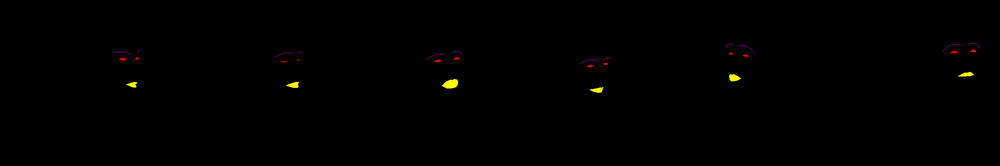

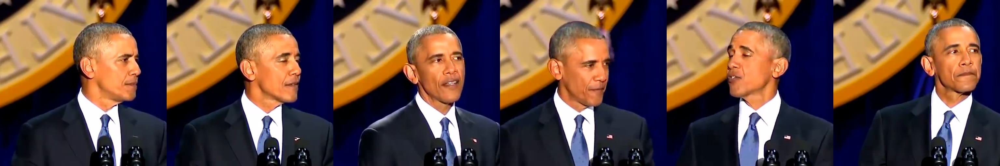

In [36]:
train_batch = minibatch(trainAB, 6, direction=direction)
_, trainA, trainB = next(train_batch)
showX(trainA)
showX(trainB)
del train_batch, trainA, trainB

In [37]:
def netG_gen(A):
    return np.concatenate([netG_generate([A[i:i+1]])[0] for i in range(A.shape[0])], axis=0)

[0/50][7800] Loss_D: 0.392062 Loss_G: 2.437601 loss_L1: 0.088913 10009.052878856659


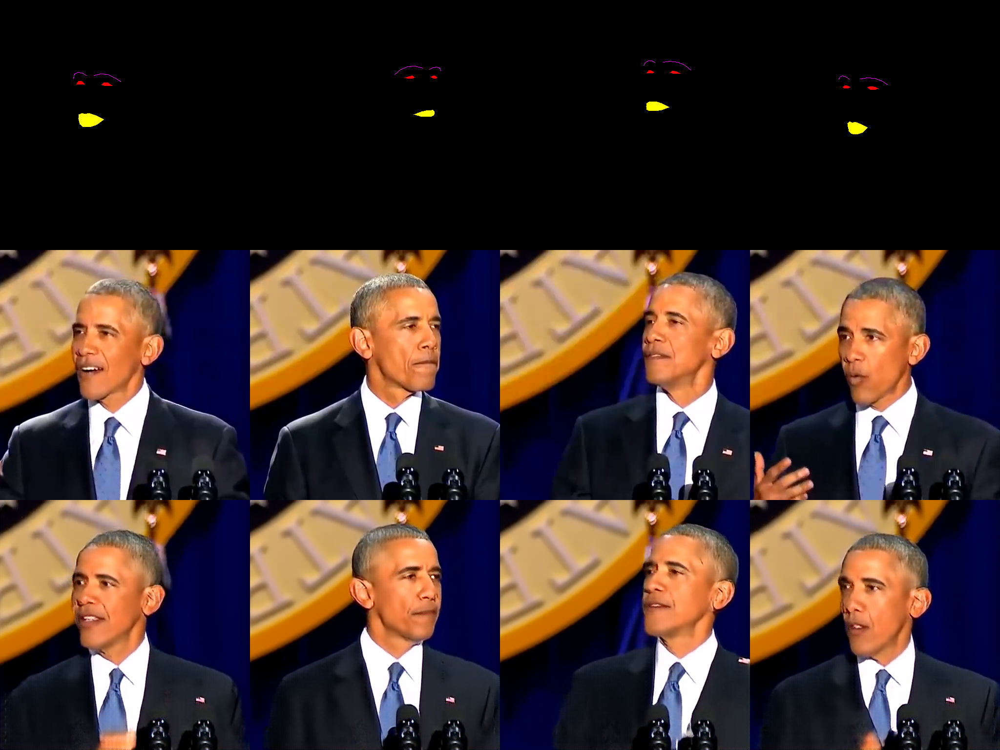

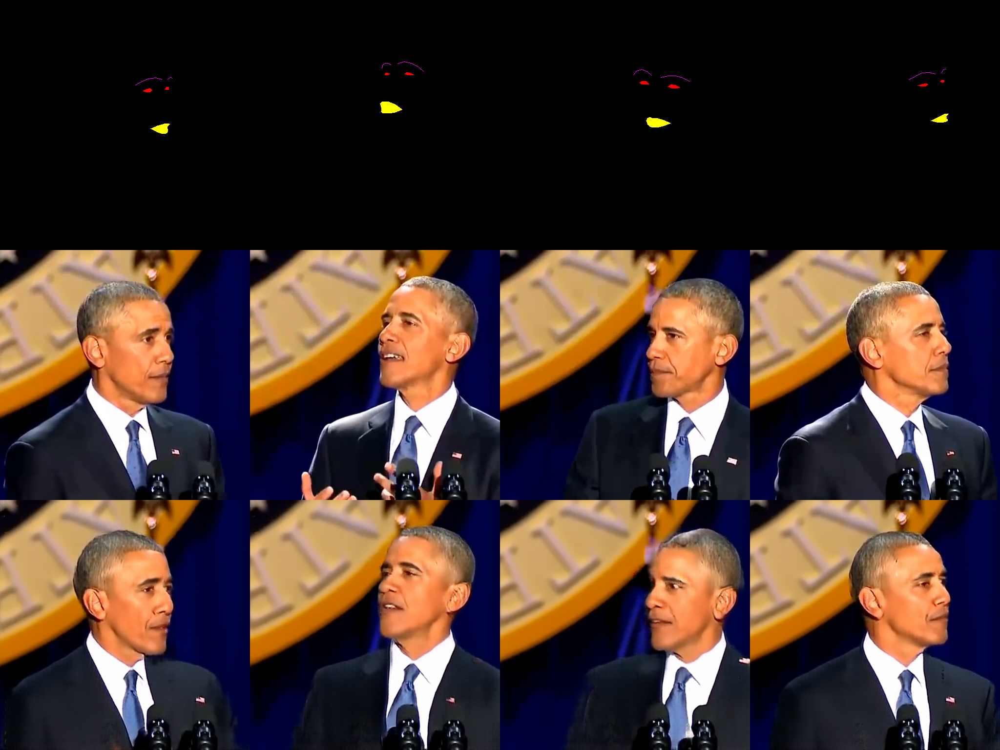

KeyboardInterrupt: 

In [92]:
import time
from IPython.display import clear_output
t0 = time.time()
niter = 50
gen_iterations = 0
errL1 = epoch = errG = 0
errL1_sum = errG_sum = errD_sum = 0

display_iters = 100
val_batch = minibatch(valAB, 4, direction)
train_batch = minibatch(trainAB, batchSize, direction)

while epoch < niter: 
    epoch, trainA, trainB = next(train_batch)        
    errD,  = netD_train([trainA, trainB])
    errD_sum +=errD

    errG, errL1 = netG_train([trainA, trainB])
    epoch, trainA, trainB = next(train_batch)
    errG, errL1 = netG_train([trainA, trainB])
    errG_sum += errG
    errL1_sum += errL1
    gen_iterations+=1
    if gen_iterations%display_iters==0:
        if gen_iterations%(display_iters)==0:
            clear_output()
        print('[%d/%d][%d] Loss_D: %f Loss_G: %f loss_L1: %f'
        % (epoch, niter, gen_iterations, errD_sum/display_iters, errG_sum/display_iters, errL1_sum/display_iters), time.time()-t0)
        _, valA, valB = train_batch.send(4) 
        fakeB = netG_gen(valA)
        showX(np.concatenate([valA, valB, fakeB], axis=0), 3)
        errL1_sum = errG_sum = errD_sum = 0
        _, valA, valB = next(val_batch)
        fakeB = netG_gen(valA)
        showX(np.concatenate([valA, valB, fakeB], axis=0), 3)
        

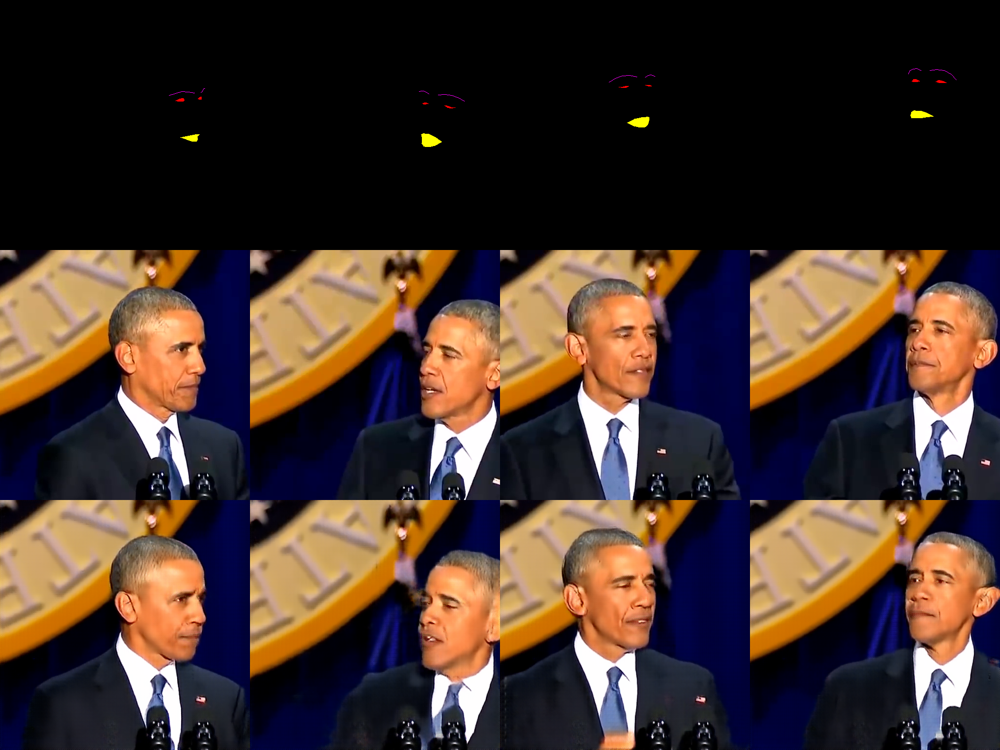

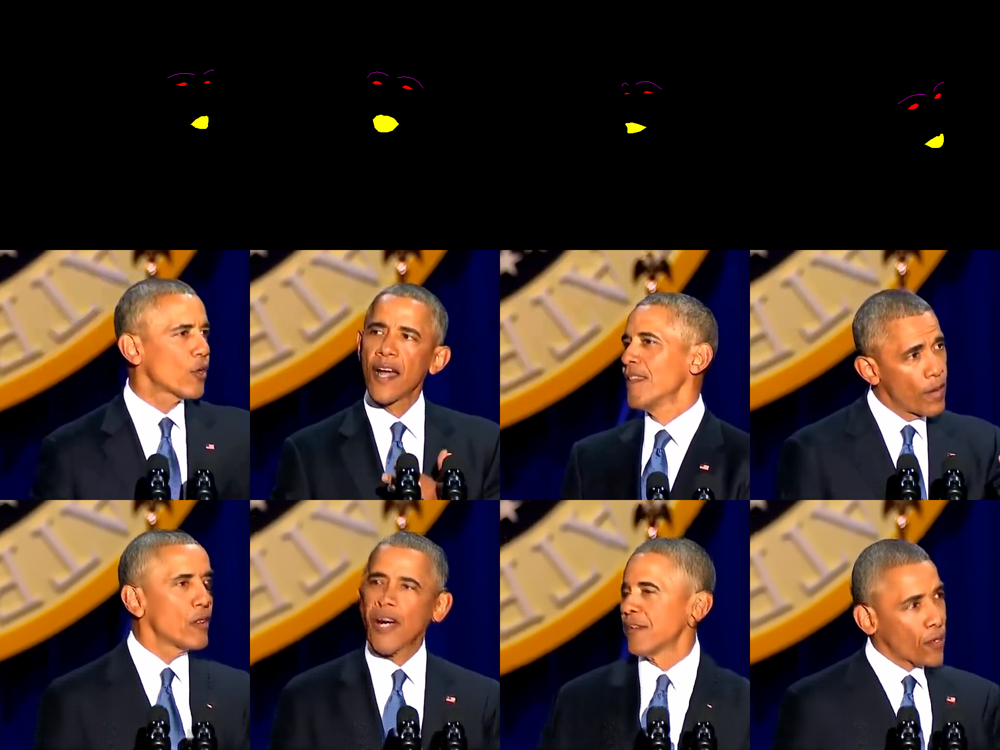

In [93]:
_, valA, valB = train_batch.send(4) 
fakeB = netG_gen(valA)
showX(np.concatenate([valA, valB, fakeB], axis=0), 3)
errL1_sum = errG_sum = errD_sum = 0
_, valA, valB = next(val_batch)
fakeB = netG_gen(valA)
showX(np.concatenate([valA, valB, fakeB], axis=0), 3)

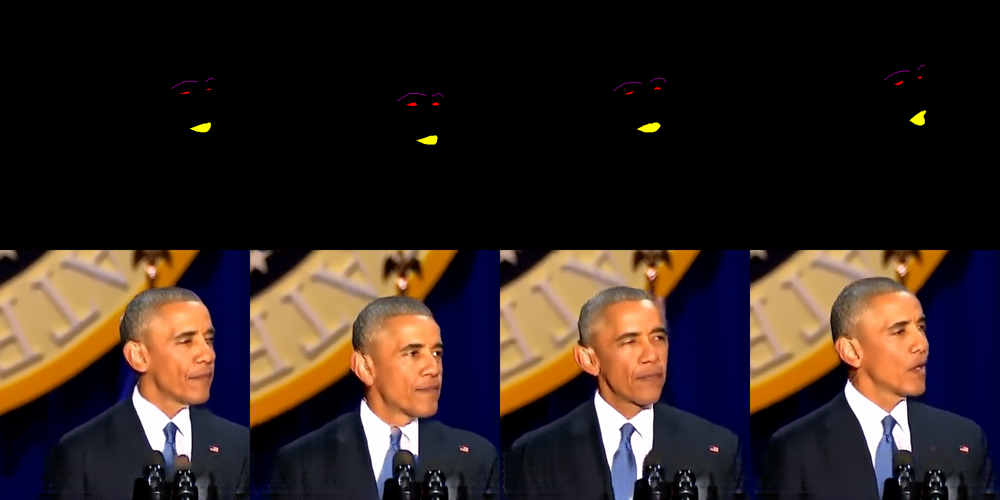

In [81]:
_, valA, valB = next(val_batch)
fakeB = netG_gen(valA)
showX(np.concatenate([valA, fakeB], axis=0), 2)

In [94]:
netG.save('obama_netG_512.model')

In [ ]:
tjw = Image.open('/home/tjw/src/Quick-Neural-Art-Transfer/content/tjw1.jpg')
tjw

In [ ]:
tjw_array = np.array(tjw)

In [ ]:
tjw_array.shape

In [83]:
import numpy as np
from PIL import Image
import dlib
sd = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
fd = dlib.get_frontal_face_detector()

In [84]:
import skimage.draw as draw
def polylines(arr, points, color, close=False):
    if close:
        arr[draw.polygon(points[:,1], points[:,0])]=color
    else:
        for i in range(points.shape[0]-1):
            arr[draw.line(*points[i, ::-1], *points[i+1,::-1])]=color
        if close:
            arr[draw.line(*points[-1, ::-1], *points[0,::-1])]=color

In [85]:
def make_shape(fn, show=False):
    img = Image.open(fn)
    img_array = np.array(img)
    rlist = fd(img_array)
    if len(rlist)!=1:
        print("skip", fn)
        return 0
    img0 = np.zeros((512,512,3), np.uint8)
    if 1:
        for r in rlist:
            shape = sd(img_array, r)
            poly = np.int32([(40+512-x.x/4.5, 40+x.y/4.5) for x in shape.parts()])
            #polylines(img0, poly[:17] , (255,255,255))
            polylines(img0, poly[17:22] , (255,0,255))
            polylines(img0, poly[22:27] , (255,0,255))
            #polylines(img0, poly[27:31] , (0,255,0))
            #polylines(img0, poly[30:36], (0,255,0), True)
            polylines(img0, poly[36:42], (255,0,0), True)
            polylines(img0, poly[42:48], (255,0,0), True)
            polylines(img0, poly[48:60], (255,255,0), True)
            polylines(img0, poly[60:68], (255,255,0), True)
    img2 = Image.fromarray(img0)
    #img.save('src_'+fn)
    #img2.save('shape_'+fn)
    if show:
        print(fn)
        display(img)
        display(img2)
    return img0

/home/tjw/src/Quick-Neural-Art-Transfer/content/tjw1.jpg


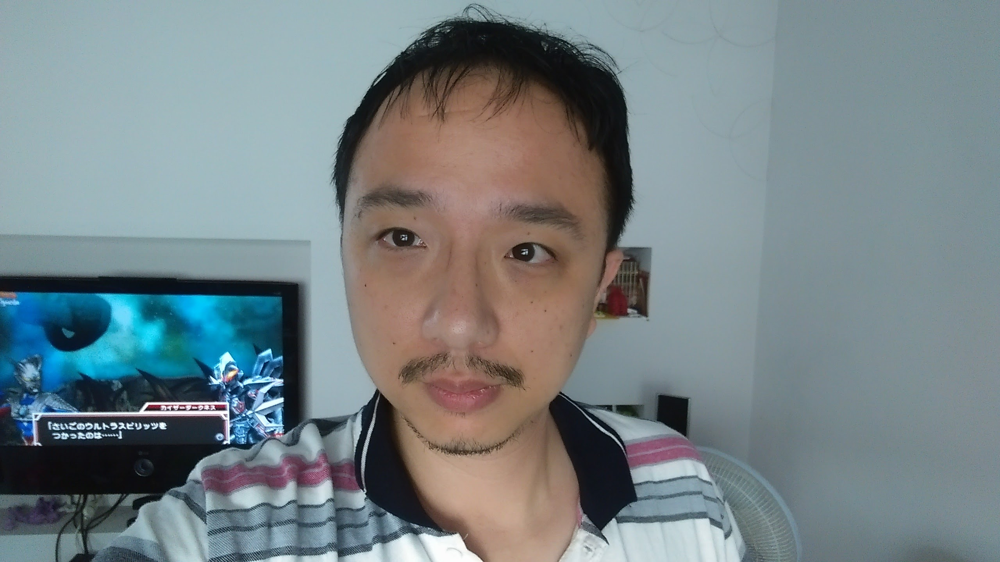

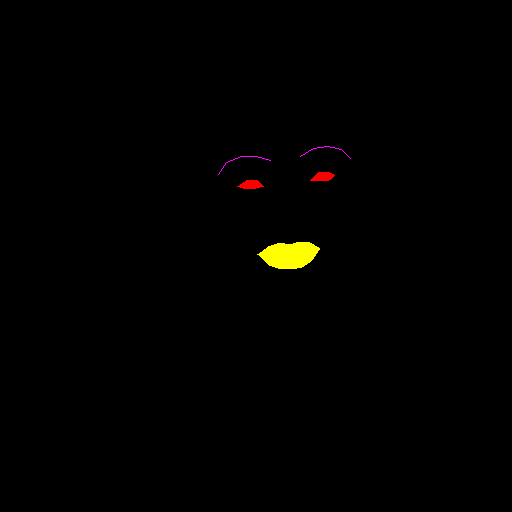

In [95]:
img0 = make_shape('/home/tjw/src/Quick-Neural-Art-Transfer/content/tjw1.jpg', True)

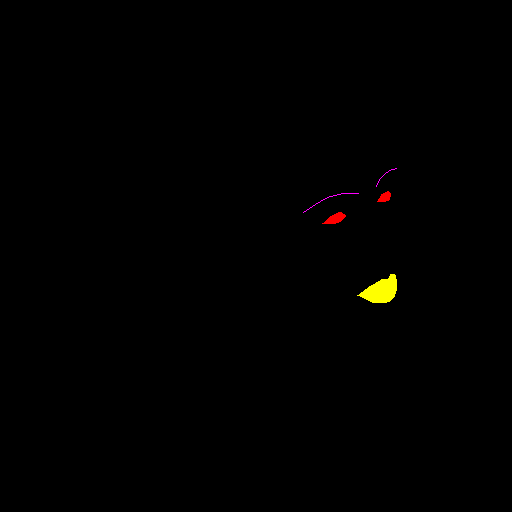

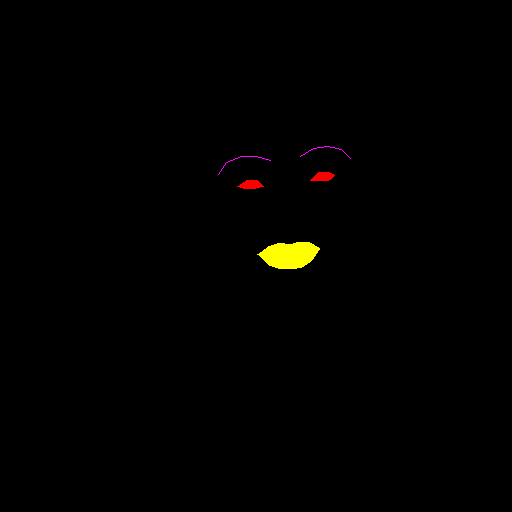

In [96]:
img2=Image.fromarray(img0)
img3 = img2  #.resize((256,256), Image.BILINEAR)
img4 = np.array(img3)/255*2-1
showX(valA[3])
showX(img4)

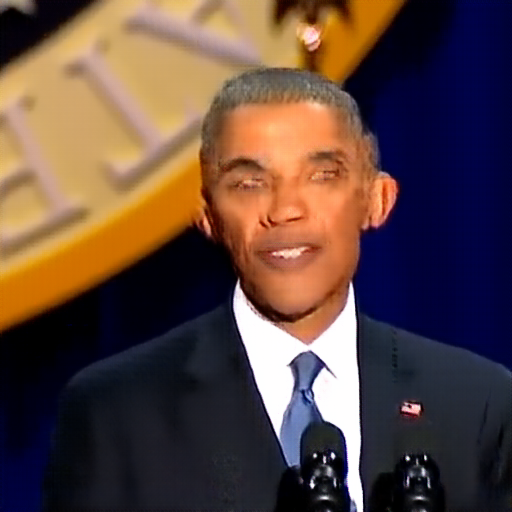

In [97]:
img2=Image.fromarray(img0)
img3 = img2 #.resize((256,256), Image.BILINEAR)
img4 = np.array(img3)/255*2-1
fakeB = netG_gen(img4[None,...])
showX(fakeB)